In [1]:
# On Adrien laptop use CEASELESS Kernel

import xarray as xr
import numpy as np
from scipy import interpolate
# import matplotlib as mpl
import matplotlib.pyplot as plt
import seastar as ss
# import seastar.oscar
# import seastar.retrieval

import datetime as dt


In [2]:
version = 'v2'
folder = '/Brest_Sample_Sept_29_2022/'
oscar_data_folder = "~/OneDrive/OneDrive - NOC/Documents/NOC-OneDrive/workLocal/SEASTAR/DATA/OSCAR/"

In [3]:
dirIn = oscar_data_folder + version + folder
list17 = [
    'SAR_CPLX_20220517T093239_13.5G_VV_00_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220517T093239_13.5G_VV_33_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220517T093239_13.5G_VV_34_pres_1_fdc_auto.sar.sig.nc',
    'SAR_CPLX_20220517T093239_13.5G_VV_77_pres_1_fdc_auto.sar.sig_INF_SAR_CPLX_20220517T093239_13.5G_VV_78_pres_1_fdc_auto.sar.sig.nc'
]

In [4]:
dsm = xr.open_dataset(
    dirIn + list17[0],
)
dsf = xr.open_dataset(
    dirIn + list17[1],
)
dsf['antenna_str'] = 'fore'
dsa = xr.open_dataset(
    dirIn + list17[2],
)
dsa['antenna_str'] = 'aft'

In [5]:
dsm['StartDate'] = dt.datetime(dsm.StartYear, dsm.StartMonth, dsm.StartDay, dsm.StartHour, dsm.StartMin, dsm.StartSec)
dsm['FinalDate'] = dt.datetime(dsm.FinalYear, dsm.FinalMonth, dsm.FinalDay, dsm.FinalHour, dsm.FinalMin, dsm.FinalSec)

In [6]:
for ds in [dsm, dsf, dsa]:
    ds['flag_down'] = ds.SigmaImageSingleLookRealPart != -9999.

In [7]:
# Compute L1b variables for Squinted antennas
for ds in [dsf, dsa]:
    ds = ss.oscar.level1.compute_multilooking_Master_Slave(ds, window=7)
#     ds = ss.oscar.level1.add_antenna_baseline(ds, baseline=0.2)
    ds = ss.oscar.level1.compute_antenna_azimuth_direction(ds, antenna=ds.antenna_str)
    ds = ss.oscar.level1.compute_time_lag_Master_Slave(ds, options='from_SAR_time')
    ds = ss.oscar.level1.compute_radial_surface_velocity(ds)
    ds['StartDate'] = dt.datetime(ds.StartYear, ds.StartMonth, ds.StartDay, ds.StartHour, ds.StartMin, ds.StartSec)
    ds['FinalDate'] = dt.datetime(ds.FinalYear, ds.FinalMonth, ds.FinalDay, ds.FinalHour, ds.FinalMin, ds.FinalSec)


/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/Users/admartin/opt/anaconda3/envs/CEASELESS_Sentinel1_RVL/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [8]:
dsa

<xarray.Dataset>
Dimensions:                                 (AntPatternAngles: 201, CrossRange: 2091, GBPGridInfo: 9, GPSTime: 1297800, GroundRange: 474, ModelTransformationTagCols: 4, ModelTransformationTagRows: 4)
Coordinates:
  * GroundRange                             (GroundRange) float32 1040.0 ... ...
  * CrossRange                              (CrossRange) float32 -11712.0 ......
  * GPSTime                                 (GPSTime) float64 2.072e+05 ... 2...
  * AntPatternAngles                        (AntPatternAngles) float64 -90.0 ...
  * GBPGridInfo                             (GBPGridInfo) float64 3.447e+05 ....
Dimensions without coordinates: ModelTransformationTagCols, ModelTransformationTagRows
Data variables:
    SigmaImageSingleLookRealPart            (CrossRange, GroundRange) float64 ...
    SigmaImageSingleLookImaginaryPart       (CrossRange, GroundRange) float64 ...
    LatImage                                (CrossRange, GroundRange) float64 ...
    LonImage                                (CrossRange, GroundRange) float64 ...
    DEMImage                                (CrossRange, GroundRange) float32 ...
    OrbLatImage                             (CrossRange, GroundRange) float64 ...
    OrbLonImage                             (CrossRange, GroundRange) float64 ...
    OrbHeightImage                          (CrossRange, GroundRange) float64 ...
    OrbTimeImage                            (CrossRange, GroundRange) float64 ...
    OrbitImage                              (CrossRange, GroundRange) float32 ...
    OrbitLatitude                           (GPSTime) float64 ...
    OrbitLongitude                          (GPSTime) float64 ...
    OrbitHeight                             (GPSTime) float64 ...
    OrbitHeading                            (GPSTime) float64 360.7 ... 360.0
    OrbitRoll                               (GPSTime) float64 ...
    OrbitPitch                              (GPSTime) float64 ...
    TxElevationGain                         (AntPatternAngles) float64 ...
    TxAzimuthGain                           (AntPatternAngles) float64 ...
    RxElevationGain                         (AntPatternAngles) float64 ...
    RxAzimuthGain                           (AntPatternAngles) float64 ...
    ModelTransformationTag                  (ModelTransformationTagCols, ModelTransformationTagRows) float64 ...
    StartYear                               int32 2022
    StartMonth                              int32 5
    StartDay                                int32 17
    StartHour                               int32 9
    StartMin                                int32 32
    StartSec                                float32 21.7155
    FinalYear                               int32 2022
    FinalMonth                              int32 5
    FinalDay                                int32 17
    FinalHour                               int32 9
    FinalMin                                int32 35
    FinalSec                                float32 3.888463
    TxPolarization                          |S1 ...
    RxPolarization                          |S1 ...
    LookDirection                           |S1 ...
    TxPointEl                               float32 ...
    TxPointAz                               float32 ...
    RxPointEl                               float32 ...
    RxPointAz                               float32 ...
    CentralFreq                             float32 13500000000.0
    TransmittedBandWidth                    float32 ...
    MeanForwardVelocity                     float32 ...
    PRF                                     float32 ...
    DopplerPresumming                       float32 ...
    WindowFunction                          float32 ...
    MinProcessedDoppler                     float32 ...
    MaxProcessedDoppler                     float32 ...
    Latitude11                              float64 ...
    Longitude11                             float64 ...
    Latitude12      

In [9]:
# Build Level1 dataset
dsl1 = ss.oscar.level1.init_level1_dataset(dsf, dsa, dsm)


In [10]:
dsl1.coords['longitude'] = dsl1.LonImage
dsl1.coords['latitude'] = dsl1.LatImage
dsl1.coords['time'] = dsl1.StartDate

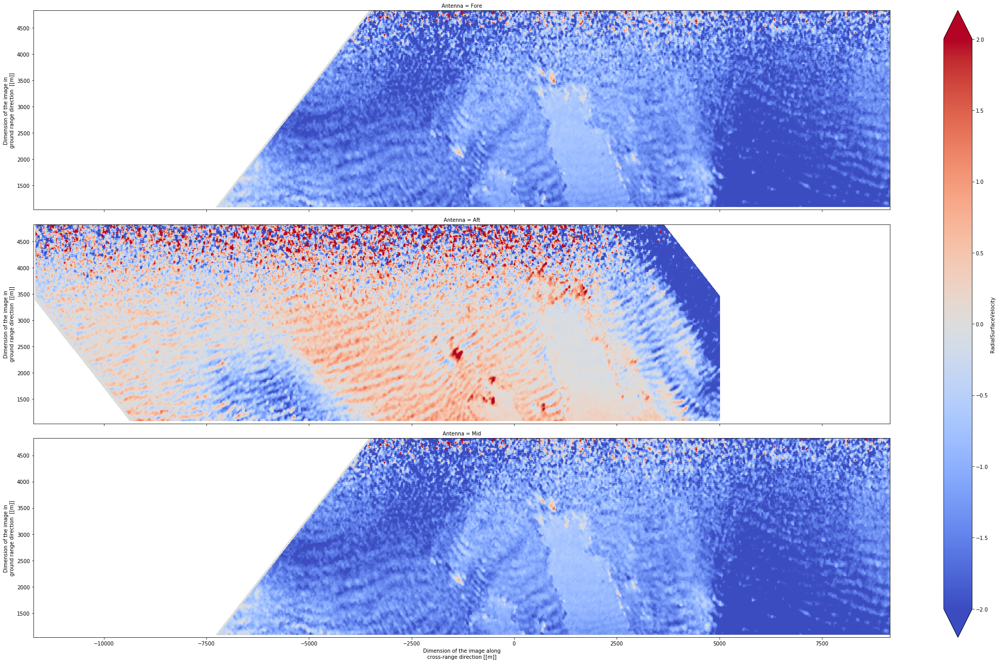

In [24]:
dsl1.RadialSurfaceVelocity.plot(
    figsize=(30, 18),
    row='Antenna',
    y='GroundRange', x='CrossRange',
    vmin=-2,vmax=2,
    cmap='coolwarm',
)
### TODO BUG with dsm

In [11]:
# Generating geophysical data fields for GMF doppler computation
aux = []

u10 = 10 # wind speed
# wdir = 135 # wind direction
wdir_list = range(0,359,45)
for ii, wdir in enumerate( wdir_list ):
    aux.append( 
        ss.oscar.level1.init_auxiliary(
            dsl1,
            dsa,
            dsf,
            u10=u10, 
            wind_direction=wdir
        )
    )
aux = xr.concat(aux, 'Wdir')
aux.coords['Wdir'] = wdir_list

In [12]:
aux

<xarray.Dataset>
Dimensions:        (CrossRange: 2610, GroundRange: 474, Wdir: 8)
Coordinates:
  * GroundRange    (GroundRange) float32 1040.0 1048.0 1056.0 ... 4816.0 4824.0
  * CrossRange     (CrossRange) float64 -1.171e+04 -1.17e+04 ... 9.16e+03
  * Wdir           (Wdir) int64 0 45 90 135 180 225 270 315
Data variables:
    WindSpeed      (Wdir, CrossRange, GroundRange) float64 10.0 10.0 ... 10.0
    WindDirection  (Wdir, CrossRange, GroundRange) float64 0.0 0.0 ... 315.0

In [13]:
# L2 OSCAR processing
dsl2 = xr.Dataset()
dsl2_list = []
for wdir in wdir_list:
    tmp = ss.retrieval.level2.compute_radial_surface_current(
            dsl1,
            dsl2,
            aux.sel(Wdir=wdir),
            gmf='mouche12',
    )
    dsl2_list.append(
        tmp.copy() # WARNING this copy is critical otherwise it is seen only as a link and it will take the latest computed value. Don't understand why... it needs to be copied here, and not for the aux above 
    )
dsl2 = xr.concat(
    dsl2_list, 'Wdir'
)
dsl2.coords['Wdir'] = wdir_list

In [14]:
dsl2

<xarray.Dataset>
Dimensions:               (Antenna: 2, CrossRange: 2610, GroundRange: 474, Wdir: 8)
Coordinates:
    longitude             (Antenna, CrossRange, GroundRange) float64 nan ... nan
    latitude              (Antenna, CrossRange, GroundRange) float64 nan ... nan
    time                  datetime64[ns] 2022-05-17T09:32:21
  * GroundRange           (GroundRange) float32 1040.0 1048.0 ... 4816.0 4824.0
  * Antenna               (Antenna) <U4 'Fore' 'Aft'
  * CrossRange            (CrossRange) float64 -1.171e+04 -1.17e+04 ... 9.16e+03
  * Wdir                  (Wdir) int64 0 45 90 135 180 225 270 315
Data variables:
    WASV                  (Wdir, Antenna, CrossRange, GroundRange) float64 na...
    RadialSurfaceCurrent  (Wdir, Antenna, CrossRange, GroundRange) float64 na...

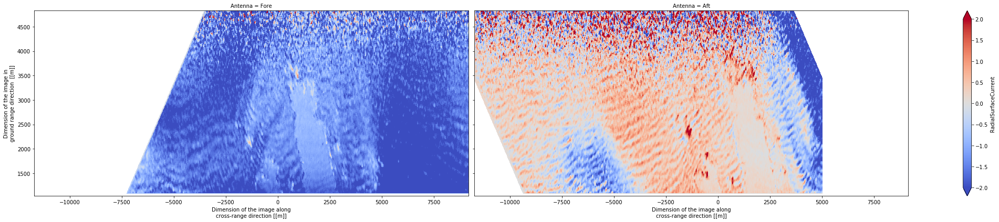

In [15]:
dsl2.sel(Wdir=135).RadialSurfaceCurrent.plot(
    figsize=(30, 6),
    col='Antenna',
    y='GroundRange', x='CrossRange',
    vmin=-2,vmax=2,
    cmap='coolwarm',
)

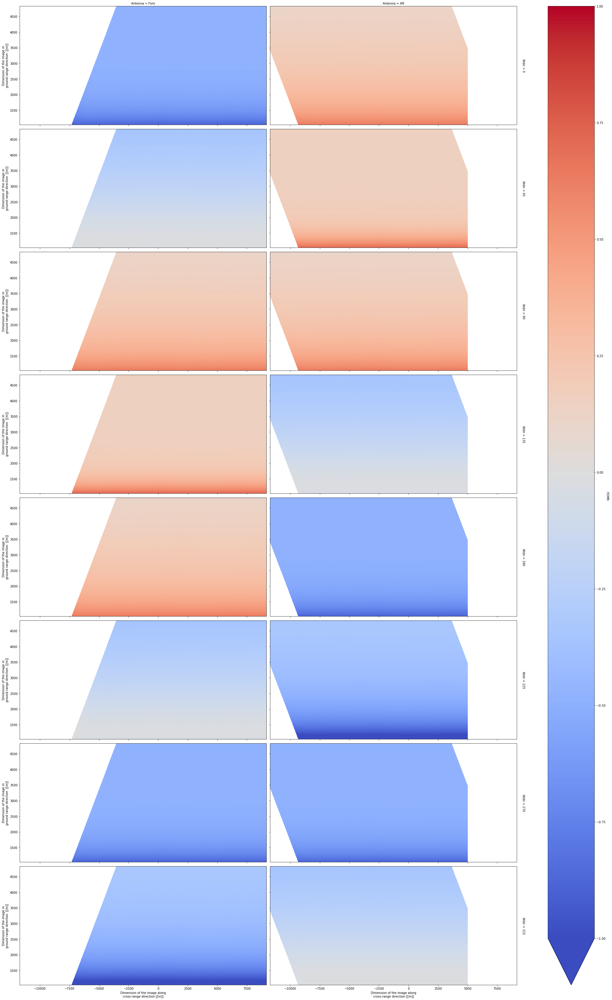

In [16]:
dsl2.WASV.plot(
    figsize=(30, 46),
    col='Antenna',
    row='Wdir',
    y='GroundRange', x='CrossRange',
    vmin=-1,vmax=1,
    cmap='coolwarm',
)

In [17]:
dsl2 = ss.retrieval.level2.compute_current_magnitude_and_direction(dsl1, dsl2)

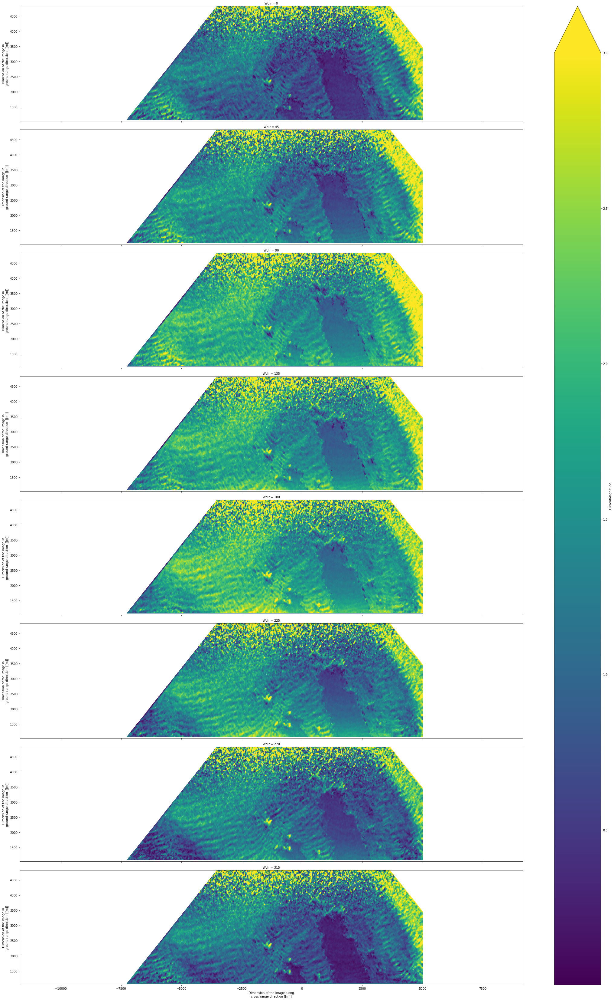

In [20]:
dsl2.CurrentMagnitude.plot(
    figsize=(30, 46),
    row='Wdir',
    y='GroundRange', x='CrossRange',
    vmax=3,
)

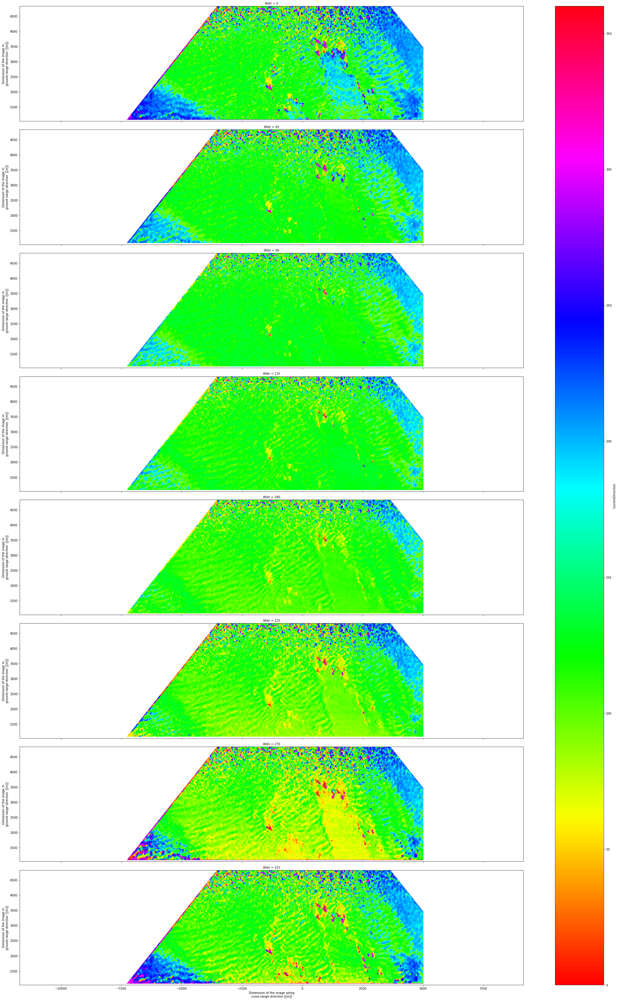

In [21]:
dsl2.CurrentDirection.plot(
    figsize=(30, 46),
    row='Wdir',
    y='GroundRange', x='CrossRange',
    cmap='hsv',
    vmin=0, vmax=360,
)

In [25]:
dsl2['C_U'], dsl2['C_V'] = ss.utils.tools.currentVelDir2UV(dsl2.CurrentMagnitude, dsl2.CurrentDirection)

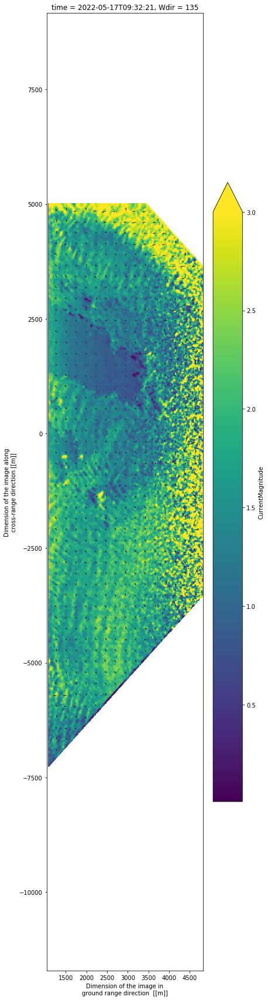

In [29]:
vector_density=30

dsl2b = dsl2.sel(Wdir=135)

dsl2b.CurrentMagnitude.plot(
    figsize=(6, 30),
    x='GroundRange', y='CrossRange',
    vmax=3,
)
plt.quiver(
    dsl2b.GroundRange.data[::vector_density], #### WARNING ### Definition of the axis... look at Direction instead
    dsl2b.CrossRange.data[::vector_density],
    dsl2b.C_V.data[::vector_density, ::vector_density],
    dsl2b.C_U.data[::vector_density, ::vector_density],
)

## Colocation with Numerical model current

In [30]:
folder = 'unrestricted/'
aux_data_folder = "~/OneDrive/OneDrive - NOC/Documents/NOC-OneDrive/workLocal/SEASTAR/DATA/aux_data/"
list17 = {}
# list17['F1'] = 'MARC_F1-MARS3D-MANGAE2500_SEASTAREX_20220517.nc'
list17['Mars2D'] = 'MARC_L1-MARS2D-FINIS250_SEASTAREX_20220517.nc'

In [31]:
Mars2D = xr.open_dataset(
    aux_data_folder + folder + list17['Mars2D']
)
cvel, cdir = ss.utils.tools.currentUV2VelDir(Mars2D.U.data, Mars2D.V.data)
Mars2D['cvel'] = ( ('time','nj','ni'), cvel )
Mars2D['cdir'] = ( ('time','nj','ni'), cdir )
Mars2D['U_c'] = ( ('time','nj','ni'), Mars2D.U.data)
Mars2D['V_c'] = ( ('time','nj','ni'), Mars2D.V.data)

In [32]:
M2D = Mars2D.sel(time=dsl2.time, tolerance='30min', method='nearest')\
            .sel(ni=slice(100,200), nj=slice(450,550))\
            .drop_dims(['ni_u', 'nj_u', 'ni_v', 'nj_v', 'ni_f', 'nj_f'])\
            .drop_vars(['SIG'])\
            .squeeze()

In [33]:
dsl2b = dsl2.sel(Wdir=135)

new_lon = dsl2b.sel(Antenna='Fore')['longitude'].values.flatten()
new_lat = dsl2b.sel(Antenna='Fore')['latitude'].values.flatten()
index_nan = np.isnan(dsl2b.sel(Antenna='Fore')['latitude'].values)
for var in M2D.data_vars:
    mat_e = np.full( dsl2b.sel(Antenna='Fore')['longitude'].shape, np.nan)
    data = M2D[var].values.flatten()
    f = interpolate.NearestNDInterpolator( 
        ( M2D.longitude.values.flatten(), M2D.latitude.values.flatten() ), data 
    ) # would be nice to have a distance MAX criteria
    e = f( new_lon[~index_nan.flatten()], new_lat[~index_nan.flatten()] )
    mat_ef = mat_e.flatten()
    mat_ef[~index_nan.flatten()] = e
    mat_e = mat_ef.reshape(mat_e.shape)
    dsl2['M2D_' + var] = ( dsl2b.RadialSurfaceCurrent.sel(Antenna='Fore').dims, mat_e )
    

In [34]:
dsl2

<xarray.Dataset>
Dimensions:               (Antenna: 2, CrossRange: 2610, GroundRange: 474, Wdir: 8)
Coordinates:
    longitude             (Antenna, CrossRange, GroundRange) float64 nan ... nan
    latitude              (Antenna, CrossRange, GroundRange) float64 nan ... nan
    time                  datetime64[ns] 2022-05-17T09:32:21
  * GroundRange           (GroundRange) float32 1040.0 1048.0 ... 4816.0 4824.0
  * Antenna               (Antenna) <U4 'Fore' 'Aft'
  * CrossRange            (CrossRange) float64 -1.171e+04 -1.17e+04 ... 9.16e+03
  * Wdir                  (Wdir) int64 0 45 90 135 180 225 270 315
Data variables:
    WASV                  (Wdir, Antenna, CrossRange, GroundRange) float64 na...
    RadialSurfaceCurrent  (Wdir, Antenna, CrossRange, GroundRange) float64 na...
    CurrentMagnitude      (Wdir, CrossRange, GroundRange) float64 nan ... nan
    CurrentDirection      (CrossRange, GroundRange, Wdir) float64 nan ... nan
    C_U                   (Wdir, CrossRange, GroundRange) float64 nan ... nan
    C_V                   (Wdir, CrossRange, GroundRange) float64 nan ... nan
    M2D_H0                (CrossRange, GroundRange) float64 nan nan ... 116.9
    M2D_XE                (CrossRange, GroundRange) float64 nan nan ... -2.28
    M2D_DELTA_XE          (CrossRange, GroundRange) float64 nan nan ... 0.02594
    M2D_cvel              (CrossRange, GroundRange) float64 nan nan ... 1.606
    M2D_cdir              (CrossRange, GroundRange) float64 nan nan ... 235.7
    M2D_U_c               (CrossRange, GroundRange) float64 nan nan ... -1.326
    M2D_V_c               (CrossRange, GroundRange) float64 nan nan ... -0.9058

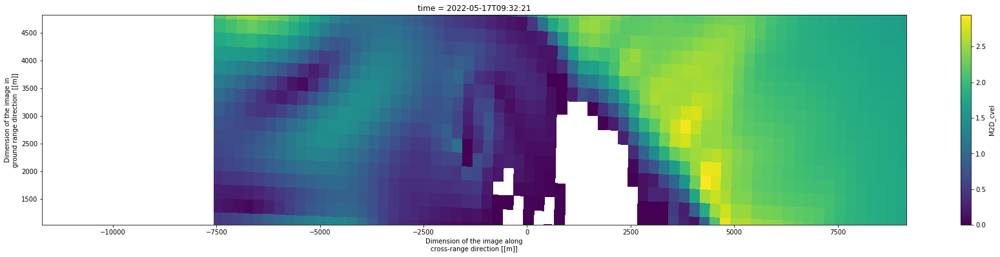

In [35]:
dsl2.M2D_cvel.plot(
    figsize=(30, 6),
    y='GroundRange', x='CrossRange',
)

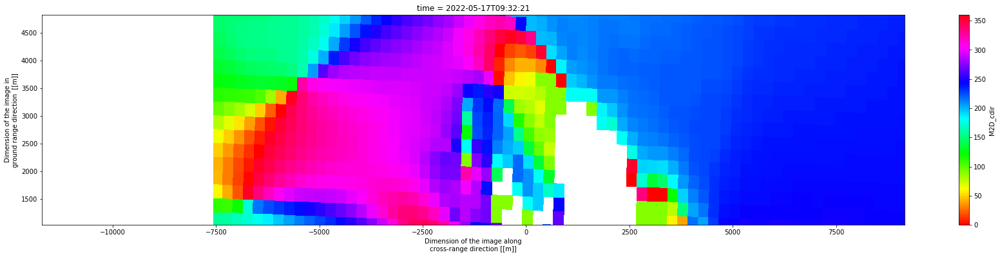

In [36]:
dsl2.M2D_cdir.plot(
    figsize=(30, 6),
    y='GroundRange', x='CrossRange',
    cmap='hsv',
    vmin=0, vmax=360,
)

Text(0.5, 1.0, 'Current Velocity')

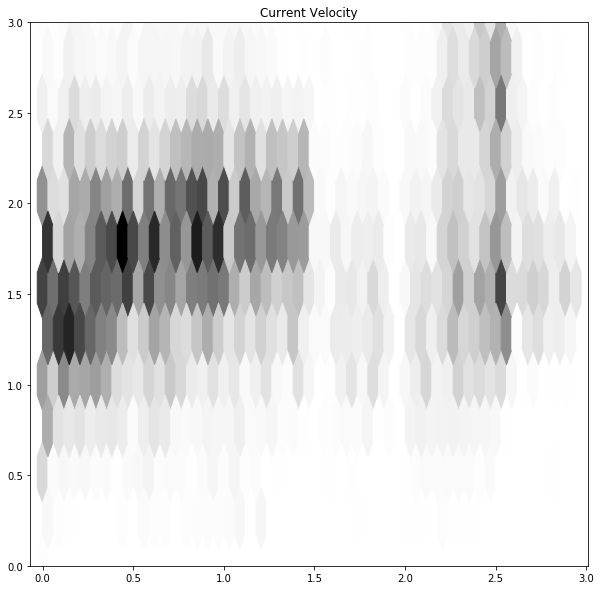

In [39]:
dsl2b = dsl2.sel(Wdir=135)

fig = plt.figure(figsize=(10, 10))
plt.hexbin(
    x=dsl2b.M2D_cvel.values.flatten(), 
    y=dsl2b.CurrentMagnitude.values.flatten(),
    gridsize=50,
    cmap='gist_yarg',
)
plt.axis('equal')
plt.ylim([0,3])
plt.title('Current Velocity')

Text(0.5, 1.0, 'Current Direction')

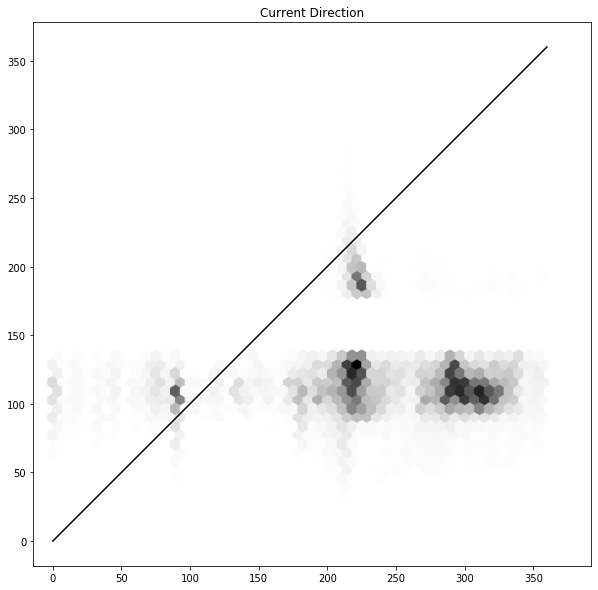

In [42]:
dsl2b = dsl2.sel(Wdir=135)

fig = plt.figure(figsize=(10, 10))
plt.hexbin(
    x=dsl2b.M2D_cdir.values.flatten(), 
    y=dsl2b.CurrentDirection.values.flatten(),
    gridsize=50,
    cmap='gist_yarg',
)
plt.axis('equal')
plt.plot([0,360],[0,360],'k')

# plt.ylim([0,3])
plt.title('Current Direction')

# TODO potential BUG the absence of data around 150° for the y-axis looks very suspicious... whatever the Wdir used...

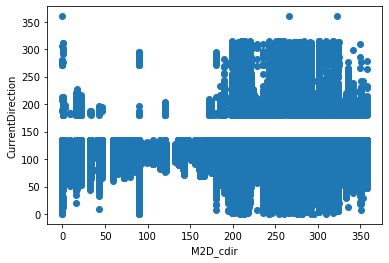

In [44]:
dsl2b = dsl2.sel(Wdir=180)

dsl2b.plot.scatter(
    x='M2D_cdir',
    y='CurrentDirection',
)
# Suspicion confirmed